# SUPPLY CHAIN ANALYTICS PROJECT

## I) PROJECT DESCRIPTION

The project provides a real-world dataset focusing on supply chain analytics. As the main data analyst for Just In Time, you will help solve key shipment and inventory management challenges, analyze supply chain inefficiencies, and create insightful dashboards to inform business stakeholders about potential problems and propose structural business improvements.

## II) METHODOLOGY

### Business demand analysis

**Requirements:** Create dashboard to analyze the business problem and improve the supply chain’s efficiency

**Method:** descriptive, exploratory and diagnostic analysis

**Tool used:** Python (Data preprocessing, data cleaning, EDA,); Power BI (Dashboard)

**Stakeholders:**

**_Sales Manager:_** Overview and keep track of customer’s demand and product sales

=> Dashboard of overall _business performance_ including sales, profit, orders, customers, best product,...

**_Inventory Manager:_** Control the inventory flow including order fulfillment, storing and distribution

=> Dashboard of _inventory management_ including warehouse inventory, number of orders from customer, storing cost,...

**_Shipping Manager:_** Overseeing daily shipping and distribution operations to customers

=> Dashboard of _shipping management_ including orders, location, timing, delay shipping,...


### **Overall target:**
Create an _interactive dashboard_ to summarize the research of the problem of the supply chain and suggest the solution


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## III) DATA PREPROCESSING

### Data overview

In [ ]:
fulfillment=pd.read_csv('Data/fulfillment.csv')
fulfillment.head()

,Product Name,Warehouse Order Fulfillment (days)
0,Perfect Fitness Perfect Rip Deck,8.3
1,Nike Men's Dri-FIT Victory Golf Polo,6.6
2,O'Brien Men's Neoprene Life Vest,5.5
3,Nike Men's Free 5.0+ Running Shoe,9.4
4,Under Armour Girls' Toddler Spine Surge Runni,6.3


In [ ]:
fulfillment.shape

(118, 2)

In [ ]:
inventory=pd.read_csv('Data/inventory.csv')
inventory.head()

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit
0,Perfect Fitness Perfect Rip Deck,201712,0,0.69517
1,Nike Men's Dri-FIT Victory Golf Polo,201712,2,1.29291
2,O'Brien Men's Neoprene Life Vest,201712,0,0.56531
3,Nike Men's Free 5.0+ Running Shoe,201712,1,1.26321
4,Under Armour Girls' Toddler Spine Surge Runni,201712,0,1.47648


In [ ]:
inventory.shape

(4200, 4)

In [ ]:
order=pd.read_csv('Data/orders_and_shipments.csv')
order.head()

,Order ID,Order Item ID,Order YearMonth,Order Year,Order Month,Order Day,Order Time,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit
0,3535,8793,201502,2015,2,21,14:07,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,Mexico,Puerto Rico,2015,2,27,Standard Class,4,400,0.25,200
1,4133,10320,201503,2015,3,2,07:37,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,Brazil,Puerto Rico,2015,3,6,Standard Class,4,400,0.09,200
2,7396,18517,201504,2015,4,18,22:47,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Central America,Mexico,Puerto Rico,2015,4,20,Standard Class,4,400,0.06,200
3,11026,27608,201506,2015,6,10,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400,0.15,200
4,11026,27609,201506,2015,6,10,22:32,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400,0.13,200


In [ ]:
order.shape

(30871, 24)

The dataset provides three data tables including order_and_shipment, inventory and fulfillment. After examining the data fields, I noticed that the dataset generally represents the following key information

**Customer:** General information about customers including identifiers and addresses

**Order:** Information about the order including date of order, product and quantity ordered, order value

**Shipment:** Shipping information including shipping date, shipping mode

**Product:** Specific information about the ordered item including product name, product category, product department

**Warehouse Inventory:** Information on inventory management for each product name including monthly inventory, warehouse location, storage costs, order fulfillment



### Data cleaning

In [ ]:
fulfillment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 2 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Product Name                          118 non-null    object 
 1    Warehouse Order Fulfillment (days)   118 non-null    float64
dtypes: float64(1), object(1)
memory usage: 2.0+ KB


In [ ]:
inventory.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4200 entries, 0 to 4199
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Product Name             4200 non-null   object 
 1    Year Month              4200 non-null   int64  
 2    Warehouse Inventory     4200 non-null   int64  
 3   Inventory Cost Per Unit  4200 non-null   float64
dtypes: float64(1), int64(2), object(1)
memory usage: 131.4+ KB


In [ ]:
order.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30871 entries, 0 to 30870
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Order ID                     30871 non-null  int64 
 1    Order Item ID               30871 non-null  int64 
 2    Order YearMonth             30871 non-null  int64 
 3    Order Year                  30871 non-null  int64 
 4    Order Month                 30871 non-null  int64 
 5    Order Day                   30871 non-null  int64 
 6   Order Time                   30871 non-null  object
 7   Order Quantity               30871 non-null  int64 
 8   Product Department           30871 non-null  object
 9   Product Category             30871 non-null  object
 10  Product Name                 30871 non-null  object
 11   Customer ID                 30871 non-null  int64 
 12  Customer Market              30871 non-null  object
 13  Customer Region              30

We have some unecessary columns in the dataset. For example, the Order Item ID column show the ID of the product in the _order_and_shipment_ table but it is not shown in the _fulfillment_ and _inventory_ table. So drop this column

In [ ]:
#fix the column name by trimming the white space in the beginning and the end
order.columns = order.columns.str.strip()
inventory.columns = inventory.columns.str.strip()
fulfillment.columns = fulfillment.columns.str.strip()

In [ ]:
#drop unecessary columns
order = order.drop(['Order Item ID','Order Time'], axis=1)
order.columns

Index(['Order ID', 'Order YearMonth', 'Order Year', 'Order Month', 'Order Day',
       'Order Quantity', 'Product Department', 'Product Category',
       'Product Name', 'Customer ID', 'Customer Market', 'Customer Region',
       'Customer Country', 'Warehouse Country', 'Shipment Year',
       'Shipment Month', 'Shipment Day', 'Shipment Mode',
       'Shipment Days - Scheduled', 'Gross Sales', 'Discount %', 'Profit'],
      dtype='object')

The columns of time feature have the datatype of int64, change them to string value

In [ ]:
#change the datatype of time feature columns
order[['Order Year','Order Month','Order Day','Shipment Year','Shipment Month','Shipment Day']] = order[['Order Year','Order Month','Order Day','Shipment Year','Shipment Month','Shipment Day']].astype(str)

The column Gross Sales and Profit in _order_and_shipment_ table have the datatype of int64, change them to the float type for later calculation

In [ ]:
#change the datatype of Gross Sales and Profit columns
order[['Gross Sales','Profit']] = order[['Gross Sales','Profit']].astype(float)

The column Discount has string value, change it to float value

In [ ]:
# Remove leading and trailing spaces from the 'Discount %' column
order['Discount %'] = order['Discount %'].str.strip()

# Replace '-' with 0 in the 'Discount %' column
order['Discount %'] = order['Discount %'].replace('-', float('0'))

# Change the datatype of 'Discount %' column to float
order['Discount %'] = order['Discount %'].astype(float)

order['Discount %']

0        0.25
1        0.09
2        0.06
3        0.15
4        0.13
         ... 
30866    0.06
30867    0.12
30868    0.09
30869    0.02
30870    0.00
Name: Discount %, Length: 30871, dtype: float64

The column Customer Country contains some special characters. For example, Peru has the special characters for letter "u". We will replace them

In [ ]:
order['Customer Country'].unique()

array(['Mexico', 'Brazil', 'Denmark', 'Netherlands', 'Germany', 'China',
       'Indonesia', 'Pakistan', 'India', 'USA', 'Hungary', 'Sudan',
       'Democratic Republic of Congo', 'Poland', 'Togo', 'Guatemala',
       'Panama', 'Chile', 'France', 'Sweden', 'Dominican�Republic',
       'Venezuela', 'South Korea', 'Madagascar', 'Iran', 'Cuba',
       'Nicaragua', 'United Kingdom', 'Afghanistan', 'Singapore',
       'Morocco', 'Spain', 'Niger', 'Turkey', 'South Africa', 'Iraq',
       'Honduras', 'Italy', 'Australia', 'Cote d�Ivoire', 'Croatia',
       'Ecuador', 'Syria', 'Haiti', 'Bangladesh', 'Argentina', 'Romania',
       'El Salvador', 'Vietnam', 'Japan', 'Nigeria', 'Belarus',
       'Uzbekistan', 'Egypt', 'Albania', 'Georgia', 'Cameroon',
       'Colombia', 'New zealand', 'Canada', 'Thailand', 'Senegal',
       'Russia', 'Per�', 'Algeria�', 'Ukraine', 'Belgium', 'Philippines',
       'Austria', 'Uruguay', 'Malaysia', 'Hong Kong', 'Saudi Arabia',
       'Switzerland', 'Ireland', 'Bulg

In [ ]:
#replace the special characters in the Customer Country column
order['Customer Country'] = order['Customer Country'].replace({
    'Dominican�Republic': 'Dominican Republic',
    'Cote d�Ivoire': 'Cote d Ivoire', # Added a comma at the end of this line
    'Per�': 'Peru',
    'Algeria�': 'Algeria',
    'Israel�':'Israel',
    'Ben�n': 'Benin'
})
order['Customer Country'].unique()

array(['Mexico', 'Brazil', 'Denmark', 'Netherlands', 'Germany', 'China',
       'Indonesia', 'Pakistan', 'India', 'USA', 'Hungary', 'Sudan',
       'Democratic Republic of Congo', 'Poland', 'Togo', 'Guatemala',
       'Panama', 'Chile', 'France', 'Sweden', 'Dominican Republic',
       'Venezuela', 'South Korea', 'Madagascar', 'Iran', 'Cuba',
       'Nicaragua', 'United Kingdom', 'Afghanistan', 'Singapore',
       'Morocco', 'Spain', 'Niger', 'Turkey', 'South Africa', 'Iraq',
       'Honduras', 'Italy', 'Australia', 'Cote d Ivoire', 'Croatia',
       'Ecuador', 'Syria', 'Haiti', 'Bangladesh', 'Argentina', 'Romania',
       'El Salvador', 'Vietnam', 'Japan', 'Nigeria', 'Belarus',
       'Uzbekistan', 'Egypt', 'Albania', 'Georgia', 'Cameroon',
       'Colombia', 'New zealand', 'Canada', 'Thailand', 'Senegal',
       'Russia', 'Peru', 'Algeria', 'Ukraine', 'Belgium', 'Philippines',
       'Austria', 'Uruguay', 'Malaysia', 'Hong Kong', 'Saudi Arabia',
       'Switzerland', 'Ireland', 'Bulga

Checking for missing value

In [ ]:
#checking for missing value
order_missing_count = order.isna().sum()
print(order_missing_count)


Order ID                     0
Order YearMonth              0
Order Year                   0
Order Month                  0
Order Day                    0
Order Quantity               0
Product Department           0
Product Category             0
Product Name                 0
Customer ID                  0
Customer Market              0
Customer Region              0
Customer Country             0
Warehouse Country            0
Shipment Year                0
Shipment Month               0
Shipment Day                 0
Shipment Mode                0
Shipment Days - Scheduled    0
Gross Sales                  0
Discount %                   0
Profit                       0
dtype: int64


In [ ]:
inventory_missing_count = inventory.isna().sum()
print(inventory_missing_count)

Product Name               0
Year Month                 0
Warehouse Inventory        0
Inventory Cost Per Unit    0
dtype: int64


In [ ]:
fulfillment_missing_count = fulfillment.isna().sum()
print(fulfillment_missing_count)

Product Name                          0
Warehouse Order Fulfillment (days)    0
dtype: int64


There are no missing value in all three tables. This dataset seems to have already been clean

Checking for duplicates

In [ ]:
#checking for duplicates
duplicate_rows = order[order.duplicated()]

In [ ]:
duplicate_rows = inventory[inventory.duplicated()]

In [ ]:
duplicate_rows = inventory[inventory.duplicated()]

There are no duplicates. This dataset's quality is good!

Checking for which product category and product department the product name belongs to

In [ ]:
# Create a new DataFrame with isolated columns
product_info = order[['Product Name', 'Product Category', 'Product Department']]
#Drop the duplicates to have the distinct product names
product = product_info.drop_duplicates()
product

,Product Name,Product Category,Product Department
0,Field & Stream Sportsman 16 Gun Fire Safe,Fishing,Fan Shop
157,Pelican Sunstream 100 Kayak,Water Sports,Fan Shop
294,Diamondback Women's Serene Classic Comfort Bi,Camping & Hiking,Fan Shop
418,O'Brien Men's Neoprene Life Vest,Indoor/Outdoor Games,Fan Shop
463,Team Golf Texas Longhorns Putter Grip,Accessories,Outdoors
...,...,...,...
15458,First aid kit,Health and Beauty,Health and Beauty
15464,Rock music,Music,Discs Shop
15621,Men's gala suit,Men's Clothing,Apparel
18869,Toys,Toys,Fan Shop


In [ ]:
# Export the product information to a new CSV file
product.to_csv('product.csv', index=False)

In inventory table, we only have the storage cost for each product name. In order to know the average storage cost for each product category and product department, we will merge the _product_ table and the _inventory_ table with the key = Product Name

In [ ]:
inventory

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit
0,Perfect Fitness Perfect Rip Deck,201712,0,0.69517
1,Nike Men's Dri-FIT Victory Golf Polo,201712,2,1.29291
2,O'Brien Men's Neoprene Life Vest,201712,0,0.56531
3,Nike Men's Free 5.0+ Running Shoe,201712,1,1.26321
4,Under Armour Girls' Toddler Spine Surge Runni,201712,0,1.47648
...,...,...,...,...
4195,TaylorMade 2017 Purelite Stand Bag,201501,0,1.44662
4196,Ogio Race Golf Shoes,201501,0,0.10310
4197,GolfBuddy VT3 GPS Watch,201501,0,1.77747
4198,Titleist Small Wheeled Travel Cover,201501,0,0.15244


In [ ]:
product

,Product Name,Product Category,Product Department
0,Field & Stream Sportsman 16 Gun Fire Safe,Fishing,Fan Shop
157,Pelican Sunstream 100 Kayak,Water Sports,Fan Shop
294,Diamondback Women's Serene Classic Comfort Bi,Camping & Hiking,Fan Shop
418,O'Brien Men's Neoprene Life Vest,Indoor/Outdoor Games,Fan Shop
463,Team Golf Texas Longhorns Putter Grip,Accessories,Outdoors
...,...,...,...
15458,First aid kit,Health and Beauty,Health and Beauty
15464,Rock music,Music,Discs Shop
15621,Men's gala suit,Men's Clothing,Apparel
18869,Toys,Toys,Fan Shop


In [ ]:
inventory_merge = pd.merge(inventory, product, on='Product Name', how='left')
inventory_merge

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department
0,Perfect Fitness Perfect Rip Deck,201712,0,0.69517,Cleats,Apparel
1,Nike Men's Dri-FIT Victory Golf Polo,201712,2,1.29291,Women's Apparel,Golf
2,O'Brien Men's Neoprene Life Vest,201712,0,0.56531,Indoor/Outdoor Games,Fan Shop
3,Nike Men's Free 5.0+ Running Shoe,201712,1,1.26321,Cardio Equipment,Footwear
4,Under Armour Girls' Toddler Spine Surge Runni,201712,0,1.47648,Shop By Sport,Golf
...,...,...,...,...,...,...
4195,TaylorMade 2017 Purelite Stand Bag,201501,0,1.44662,Golf Gloves,Outdoors
4196,Ogio Race Golf Shoes,201501,0,0.10310,Golf Bags & Carts,Outdoors
4197,GolfBuddy VT3 GPS Watch,201501,0,1.77747,Kids' Golf Clubs,Outdoors
4198,Titleist Small Wheeled Travel Cover,201501,0,0.15244,Golf Gloves,Outdoors


There are some missing value from the merged table. Checking them

In [ ]:
#Checking the missing value
missing_count = inventory_merge.isna().sum()
missing_count

Product Name                 0
Year Month                   0
Warehouse Inventory          0
Inventory Cost Per Unit      0
Product Category           175
Product Department         175
dtype: int64

In [ ]:
null_records = inventory_merge[(inventory_merge['Product Category'].isna()) | (inventory_merge['Product Department'].isna())]
null_records

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department
56,Dell Laptop,201712,14,1.56369,NaN,NaN
114,SOLE E35 Elliptical,201712,1,0.36106,NaN,NaN
115,Bushnell Pro X7 Jolt Slope Rangefinder,201712,9,2.22684,NaN,NaN
116,SOLE E25 Elliptical,201712,23,1.84297,NaN,NaN
117,Bowflex SelectTech 1090 Dumbbells,201712,36,1.49431,NaN,NaN
...,...,...,...,...,...,...
4068,Dell Laptop,201502,37,2.16324,NaN,NaN
4126,SOLE E35 Elliptical,201502,3,1.85317,NaN,NaN
4127,Bushnell Pro X7 Jolt Slope Rangefinder,201502,35,1.22691,NaN,NaN
4128,SOLE E25 Elliptical,201502,18,1.07032,NaN,NaN


In [ ]:
null_records['Product Name'].unique()

array(['Dell Laptop', 'SOLE E35 Elliptical',
       'Bushnell Pro X7 Jolt Slope Rangefinder', 'SOLE E25 Elliptical',
       'Bowflex SelectTech 1090 Dumbbells'], dtype=object)

There are 5 product names that appear in the _inventory_ table but not in the _order_ table. This means that these are items that are in the company's inventory but have not been ordered by the customer. So it's impossible to determine which product category and product department those product names belong to

After investigating carefully, I decided to keep these product names as they account for a considerable amount of storage cost

In [ ]:
inventory_merge['Product Category'].fillna('None', inplace=True)
inventory_merge['Product Department'].fillna('None', inplace=True)
inventory_merge[inventory_merge['Product Department'].isna()]

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department


### Feature creation

Create datetime feature

In [ ]:
from datetime import datetime
#Create order date and shipment date features from the year, month, day column
order['Order Date'] = order['Order Year'].astype(str) + '/' + order['Order Month'].astype(str) + '/' + order['Order Day'].astype(str)
order['Order Date'] = pd.to_datetime(order['Order Date'])
order['Order Date'] = order['Order Date'].dt.strftime('%Y/%m/%d')
order['Order YearMonth'] = order['Order YearMonth'].astype(str)

order['Shipment Date'] = order['Shipment Year'].astype(str) + '/' + order['Shipment Month'].astype(str) + '/' + order['Shipment Day'].astype(str)
order['Shipment Date'] = pd.to_datetime(order['Shipment Date'])
order['Shipment Date'] = order['Shipment Date'].dt.strftime('%Y-%m-%d')
order['Shipment YearMonth'] = order['Shipment Year'].astype(str) + '-' + order['Shipment Month'].astype(str)

In [ ]:
inventory_merge['Year Month']=pd.to_datetime(inventory_merge['Year Month'], format='%Y%m').dt.strftime('%Y/%m')
inventory_merge

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department
0,Perfect Fitness Perfect Rip Deck,2017/12,0,0.69517,Cleats,Apparel
1,Nike Men's Dri-FIT Victory Golf Polo,2017/12,2,1.29291,Women's Apparel,Golf
2,O'Brien Men's Neoprene Life Vest,2017/12,0,0.56531,Indoor/Outdoor Games,Fan Shop
3,Nike Men's Free 5.0+ Running Shoe,2017/12,1,1.26321,Cardio Equipment,Footwear
4,Under Armour Girls' Toddler Spine Surge Runni,2017/12,0,1.47648,Shop By Sport,Golf
...,...,...,...,...,...,...
4195,TaylorMade 2017 Purelite Stand Bag,2015/01,0,1.44662,Golf Gloves,Outdoors
4196,Ogio Race Golf Shoes,2015/01,0,0.10310,Golf Bags & Carts,Outdoors
4197,GolfBuddy VT3 GPS Watch,2015/01,0,1.77747,Kids' Golf Clubs,Outdoors
4198,Titleist Small Wheeled Travel Cover,2015/01,0,0.15244,Golf Gloves,Outdoors


Create shipment feature

In [ ]:
#Create shipping time feature
order['Shipping Time'] = pd.to_datetime(order['Shipment Date']) - pd.to_datetime(order['Order Date'])
order['Shipping Time'] = order['Shipping Time'].dt.days

#Create delay shipment feature
def calculate_delay(row):
    if row['Shipping Time'] > row['Shipment Days - Scheduled']:
        return 'Late'
    else:
        return 'On time'

order['Delay Shipment'] = order.apply(calculate_delay, axis=1)
order

,Order ID,Order YearMonth,Order Year,Order Month,Order Day,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Shipment YearMonth,Shipping Time,Delay Shipment
0,3535,201502,2015,2,21,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,Mexico,Puerto Rico,2015,2,27,Standard Class,4,400.0,0.25,200.0,2015/02/21,2015-02-27,2015-2,6,Late
1,4133,201503,2015,3,2,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,Brazil,Puerto Rico,2015,3,6,Standard Class,4,400.0,0.09,200.0,2015/03/02,2015-03-06,2015-3,4,On time
2,7396,201504,2015,4,18,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Central America,Mexico,Puerto Rico,2015,4,20,Standard Class,4,400.0,0.06,200.0,2015/04/18,2015-04-20,2015-4,2,On time
3,11026,201506,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.15,200.0,2015/06/10,2015-06-12,2015-6,2,On time
4,11026,201506,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.13,200.0,2015/06/10,2015-06-12,2015-6,2,On time
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30866,73246,201712,2017,12,5,1,Fan Shop,Toys,Toys,16799,Pacific Asia,Oceania,Australia,Puerto Rico,2017,12,11,Standard Class,4,12.0,0.06,6.0,2017/12/05,2017-12-11,2017-12,6,Late
30867,7908,201504,2015,4,26,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,11950,LATAM,South America,Paraguay,Puerto Rico,2015,4,30,Standard Class,4,30.0,0.12,68.0,2015/04/26,2015-04-30,2015-4,4,On time
30868,29326,201603,2016,3,4,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,8161,Pacific Asia,South Asia,India,Puerto Rico,2016,3,6,Second Class,2,30.0,0.09,68.0,2016/03/04,2016-03-06,2016-3,2,On time
30869,63308,201707,2017,7,13,1,Fan Shop,Hunting & Shooting,insta-bed Neverflat Air Mattress,5733,Europe,Western Europe,Germany,Puerto Rico,2017,7,17,Second Class,2,150.0,0.02,60.0,2017/07/13,2017-07-17,2017-7,4,Late


In [ ]:
order['Shipping Time'].describe()

count    30871.000000
mean         3.560753
std        131.195817
min       -975.000000
25%          2.000000
50%          3.000000
75%          5.000000
max        978.000000
Name: Shipping Time, dtype: float64

Text(0.5, 1.0, 'Shipping Time')

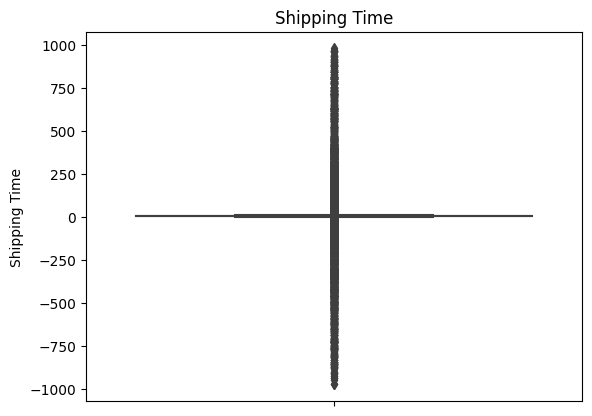

In [ ]:
#Drawing a boxplot of Unit Price
sns.boxplot(y='Shipping Time', data=order)
plt.title('Shipping Time')

The Shipping column has some negative values. Thís is due to the error in recording since the Shipment Date < Order Date. There are also unusually large values. Normally, in the United States, standard shipping within the same country might take anywhere from 2 to 7 business days. International standard shipping can take longer, often ranging from 1 to 4 weeks. I decided to take this information as a reference and drop the shipping time values that < 0 and > 28

In [ ]:
#drop the abnormal Shipping Time
order = order[(order['Shipping Time'] >= 0) & (order['Shipping Time'] <= 28)]
order

,Order ID,Order YearMonth,Order Year,Order Month,Order Day,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Shipment YearMonth,Shipping Time,Delay Shipment
0,3535,201502,2015,2,21,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,Mexico,Puerto Rico,2015,2,27,Standard Class,4,400.0,0.25,200.0,2015/02/21,2015-02-27,2015-2,6,Late
1,4133,201503,2015,3,2,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,Brazil,Puerto Rico,2015,3,6,Standard Class,4,400.0,0.09,200.0,2015/03/02,2015-03-06,2015-3,4,On time
2,7396,201504,2015,4,18,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Central America,Mexico,Puerto Rico,2015,4,20,Standard Class,4,400.0,0.06,200.0,2015/04/18,2015-04-20,2015-4,2,On time
3,11026,201506,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.15,200.0,2015/06/10,2015-06-12,2015-6,2,On time
4,11026,201506,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.13,200.0,2015/06/10,2015-06-12,2015-6,2,On time
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30866,73246,201712,2017,12,5,1,Fan Shop,Toys,Toys,16799,Pacific Asia,Oceania,Australia,Puerto Rico,2017,12,11,Standard Class,4,12.0,0.06,6.0,2017/12/05,2017-12-11,2017-12,6,Late
30867,7908,201504,2015,4,26,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,11950,LATAM,South America,Paraguay,Puerto Rico,2015,4,30,Standard Class,4,30.0,0.12,68.0,2015/04/26,2015-04-30,2015-4,4,On time
30868,29326,201603,2016,3,4,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,8161,Pacific Asia,South Asia,India,Puerto Rico,2016,3,6,Second Class,2,30.0,0.09,68.0,2016/03/04,2016-03-06,2016-3,2,On time
30869,63308,201707,2017,7,13,1,Fan Shop,Hunting & Shooting,insta-bed Neverflat Air Mattress,5733,Europe,Western Europe,Germany,Puerto Rico,2017,7,17,Second Class,2,150.0,0.02,60.0,2017/07/13,2017-07-17,2017-7,4,Late


Create business performance feature

In [ ]:
#Create net sales and unit price feature
order['Net Sales'] = order['Gross Sales'] - order['Gross Sales'] * order['Discount %']
order['Unit Price'] = order['Gross Sales'] / order['Order Quantity']
order

,Order ID,Order YearMonth,Order Year,Order Month,Order Day,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Shipment YearMonth,Shipping Time,Delay Shipment,Net Sales,Unit Price
0,3535,201502,2015,2,21,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,Mexico,Puerto Rico,2015,2,27,Standard Class,4,400.0,0.25,200.0,2015/02/21,2015-02-27,2015-2,6,Late,300.00,400.0
1,4133,201503,2015,3,2,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,Brazil,Puerto Rico,2015,3,6,Standard Class,4,400.0,0.09,200.0,2015/03/02,2015-03-06,2015-3,4,On time,364.00,400.0
2,7396,201504,2015,4,18,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Central America,Mexico,Puerto Rico,2015,4,20,Standard Class,4,400.0,0.06,200.0,2015/04/18,2015-04-20,2015-4,2,On time,376.00,400.0
3,11026,201506,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.15,200.0,2015/06/10,2015-06-12,2015-6,2,On time,340.00,400.0
4,11026,201506,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.13,200.0,2015/06/10,2015-06-12,2015-6,2,On time,348.00,400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30866,73246,201712,2017,12,5,1,Fan Shop,Toys,Toys,16799,Pacific Asia,Oceania,Australia,Puerto Rico,2017,12,11,Standard Class,4,12.0,0.06,6.0,2017/12/05,2017-12-11,2017-12,6,Late,11.28,12.0
30867,7908,201504,2015,4,26,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,11950,LATAM,South America,Paraguay,Puerto Rico,2015,4,30,Standard Class,4,30.0,0.12,68.0,2015/04/26,2015-04-30,2015-4,4,On time,26.40,30.0
30868,29326,201603,2016,3,4,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,8161,Pacific Asia,South Asia,India,Puerto Rico,2016,3,6,Second Class,2,30.0,0.09,68.0,2016/03/04,2016-03-06,2016-3,2,On time,27.30,30.0
30869,63308,201707,2017,7,13,1,Fan Shop,Hunting & Shooting,insta-bed Neverflat Air Mattress,5733,Europe,Western Europe,Germany,Puerto Rico,2017,7,17,Second Class,2,150.0,0.02,60.0,2017/07/13,2017-07-17,2017-7,4,Late,147.00,150.0


In [ ]:
#Create storage cost feature
inventory = inventory_merge
inventory['Storage Cost'] = inventory['Inventory Cost Per Unit']*inventory['Warehouse Inventory']
inventory

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department,Storage Cost
0,Perfect Fitness Perfect Rip Deck,2017/12,0,0.69517,Cleats,Apparel,0.00000
1,Nike Men's Dri-FIT Victory Golf Polo,2017/12,2,1.29291,Women's Apparel,Golf,2.58582
2,O'Brien Men's Neoprene Life Vest,2017/12,0,0.56531,Indoor/Outdoor Games,Fan Shop,0.00000
3,Nike Men's Free 5.0+ Running Shoe,2017/12,1,1.26321,Cardio Equipment,Footwear,1.26321
4,Under Armour Girls' Toddler Spine Surge Runni,2017/12,0,1.47648,Shop By Sport,Golf,0.00000
...,...,...,...,...,...,...,...
4195,TaylorMade 2017 Purelite Stand Bag,2015/01,0,1.44662,Golf Gloves,Outdoors,0.00000
4196,Ogio Race Golf Shoes,2015/01,0,0.10310,Golf Bags & Carts,Outdoors,0.00000
4197,GolfBuddy VT3 GPS Watch,2015/01,0,1.77747,Kids' Golf Clubs,Outdoors,0.00000
4198,Titleist Small Wheeled Travel Cover,2015/01,0,0.15244,Golf Gloves,Outdoors,0.00000


## IV) EXPLORATORY DATA ANALYSIS

In the EDA, I focus on analyzing the characteristics, behaviors, pattern and trends based on these criterions: **Business Performance; Customer; Product; Inventory; Shipment**

### **Business Performance**

In [ ]:
#overall descriptive analysis of the business sales' key metrics
order[['Order Quantity','Unit Price','Gross Sales','Net Sales','Discount %','Profit']].describe()

,Order Quantity,Unit Price,Gross Sales,Net Sales,Discount %,Profit
count,25861.000000,25861.000000,25861.000000,25861.000000,25861.000000,25861.000000
mean,2.097135,139.907506,198.150884,178.030088,0.101419,126.304513
std,1.451910,122.281886,111.770964,101.533400,0.070553,50.656121
min,1.000000,10.000000,10.000000,8.250000,0.000000,6.000000
25%,1.000000,50.000000,120.000000,105.600000,0.040000,97.000000
50%,1.000000,65.000000,200.000000,164.000000,0.090000,125.000000
75%,3.000000,200.000000,300.000000,245.000000,0.160000,147.000000
max,5.000000,533.000000,533.000000,533.000000,0.250000,258.000000


The Unit Price has mean of about 136 but the maximum value is up to five times at 533. So we should check for the outliner of the Unit Price column

Text(0.5, 1.0, 'Unit Price')

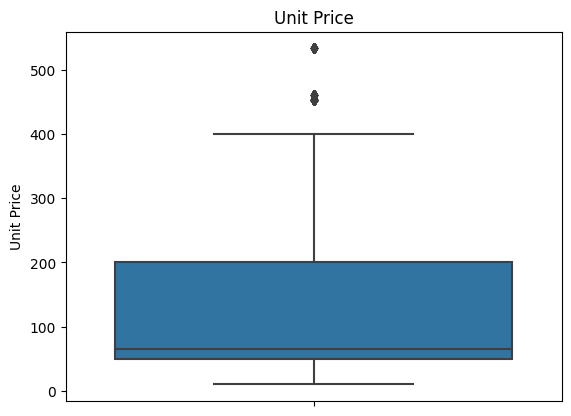

In [ ]:
#Drawing a boxplot of Unit Price
sns.boxplot(y='Unit Price', data=order)
plt.title('Unit Price')

It definitely has the outliners, let's check them

In [ ]:
#Show the recording of the outliners
order[order['Unit Price'] > 400]

,Order ID,Order YearMonth,Order Year,Order Month,Order Day,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Shipment YearMonth,Shipping Time,Delay Shipment,Net Sales,Unit Price
9387,71926,201711,2017,11,15,1,Outdoors,Garden,Lawn mower,15479,Pacific Asia,Oceania,Australia,Puerto Rico,2017,11,17,Standard Class,4,533.0,0.06,258.0,2017/11/15,2017-11-17,2017-11,2,On time,501.02,533.0
14936,69546,201710,2017,10,11,1,Technology,Cameras,Web Camera,13099,Europe,Northern Europe,Sweden,USA,2017,10,14,Standard Class,4,452.0,0.17,219.0,2017/10/11,2017-10-14,2017-10,3,On time,375.16,452.0
14937,69656,201710,2017,10,12,1,Technology,Cameras,Web Camera,13209,Europe,Northern Europe,United Kingdom,USA,2017,10,14,Standard Class,4,452.0,0.15,219.0,2017/10/12,2017-10-14,2017-10,2,On time,384.20,452.0
14938,69665,201710,2017,10,13,1,Technology,Cameras,Web Camera,13218,Europe,Northern Europe,Ireland,USA,2017,10,15,First Class,1,452.0,0.03,219.0,2017/10/13,2017-10-15,2017-10,2,Late,438.44,452.0
14939,69823,201710,2017,10,14,1,Technology,Cameras,Web Camera,13376,Europe,Northern Europe,Sweden,USA,2017,10,16,Standard Class,4,452.0,0.07,219.0,2017/10/14,2017-10-16,2017-10,2,On time,420.36,452.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28877,75091,201712,2017,12,9,1,Outdoors,Garden,Lawn mower,18644,Pacific Asia,Southeast Asia,Indonesia,Puerto Rico,2017,12,13,First Class,1,533.0,0.03,258.0,2017/12/09,2017-12-13,2017-12,4,Late,517.01,533.0
28910,71801,201711,2017,11,11,1,Outdoors,Garden,Lawn mower,15354,Pacific Asia,Oceania,Australia,Puerto Rico,2017,11,13,First Class,1,533.0,0.05,258.0,2017/11/11,2017-11-13,2017-11,2,Late,506.35,533.0
28911,71978,201711,2017,11,11,1,Outdoors,Garden,Lawn mower,15531,Pacific Asia,Oceania,Australia,Puerto Rico,2017,11,16,Second Class,2,533.0,0.09,258.0,2017/11/11,2017-11-16,2017-11,5,Late,485.03,533.0
28912,71985,201711,2017,11,13,1,Outdoors,Garden,Lawn mower,15538,Pacific Asia,Oceania,Australia,Puerto Rico,2017,11,18,Second Class,2,533.0,0.01,258.0,2017/11/13,2017-11-18,2017-11,5,Late,527.67,533.0


After carefully reviewing the business's operation and product characteristics, I have decided not to exclude these outliners. The majority of outliners are electronic items so it's their nature to have a high price tag

calculating the total net sales, profit and profit margin by the company

In [ ]:
# Calculate Total Net Sales, Total Profit, and Profit Margin
total_net_sales = order['Net Sales'].sum()
total_profit = order['Profit'].sum()
profit_margin = (total_profit / total_net_sales) * 100

print("Total Net Sales:", total_net_sales)
print("Total Profit:", total_profit)
print("Profit Margin:", profit_margin, "%")

Total Net Sales: 4604036.11
Total Profit: 3266361.0
Profit Margin: 70.94559907784911 %


**Take away:** The company has had an impressive business performance over the past 3 years with net sales of about 5.5 millions and profit of nearly 4 millions. As a result, the company has a very good profit margin, up to 72%

Since we only record profit when the goods are delivered to the customer, I will chose the shipment date for further calculation related to sales and profit

calculating the average net sales and profit per month


In [ ]:
average_net_sales = total_net_sales/37
average_profit = total_profit/37

print("Average Net Sales:", average_net_sales)
print("Average Profit:", average_profit)

Average Net Sales: 124433.40837837839
Average Profit: 88280.02702702703


The company has average net sales of 150k and profit of about 108k per month

_How do the net sales and profit change over time?_

<AxesSubplot: xlabel='Shipment YearMonth', ylabel='Profit Margin'>

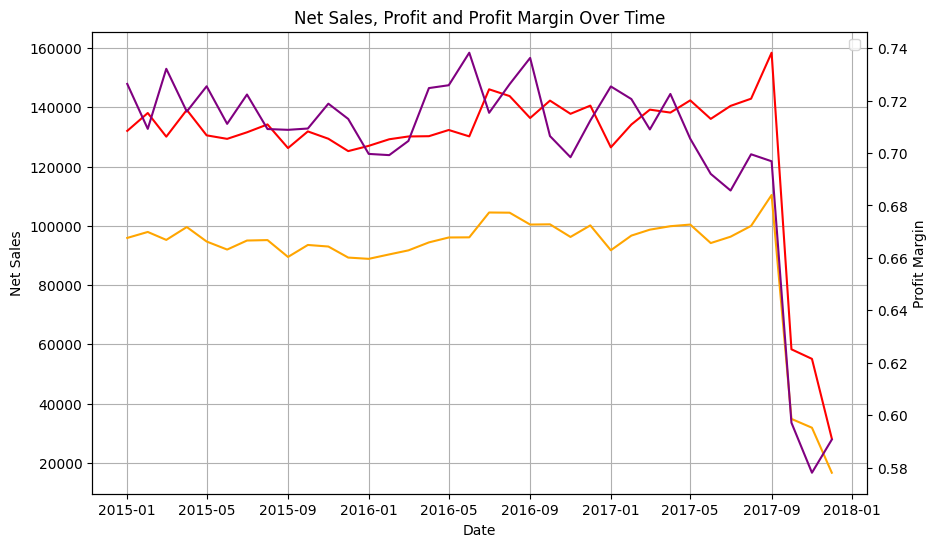

In [ ]:
order['Shipment YearMonth'] = pd.to_datetime(order['Shipment YearMonth'], format='%Y/%m')

# Group data by year and month, and calculate the metrics
sales = order.groupby(['Shipment YearMonth']).agg({'Net Sales':'sum',
                                                'Profit':'sum'})
sales['Profit_margin'] = sales['Profit'] / sales['Net Sales']

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Shipment YearMonth',y='Net Sales', data = sales, color='red')
sns.lineplot(x='Shipment YearMonth',y='Profit', data = sales, color='orange')
plt.xlabel('Date')
plt.title('Net Sales, Profit and Profit Margin Over Time')
plt.legend()
plt.grid(True)

# Create a secondary y-axis
ax2 = plt.gca().twinx()
ax2.set_ylabel('Profit Margin')
sns.lineplot(x='Shipment YearMonth', y='Profit_margin', data=sales, color='purple', ax=ax2)

The company's overall business performance reveals a period of stagnant net sales and profit, followed by a sharp decline in Q4/2017.
Particularly, Net sales went sideway for a long time before plummeting by 70% in Q4/2017. The same trend also happen with Profit during that period.
Although the Profit Margin has decresed by 30% but it was still a pretty good profit margin of nearly 60%

calculating how do the number of orders change over time

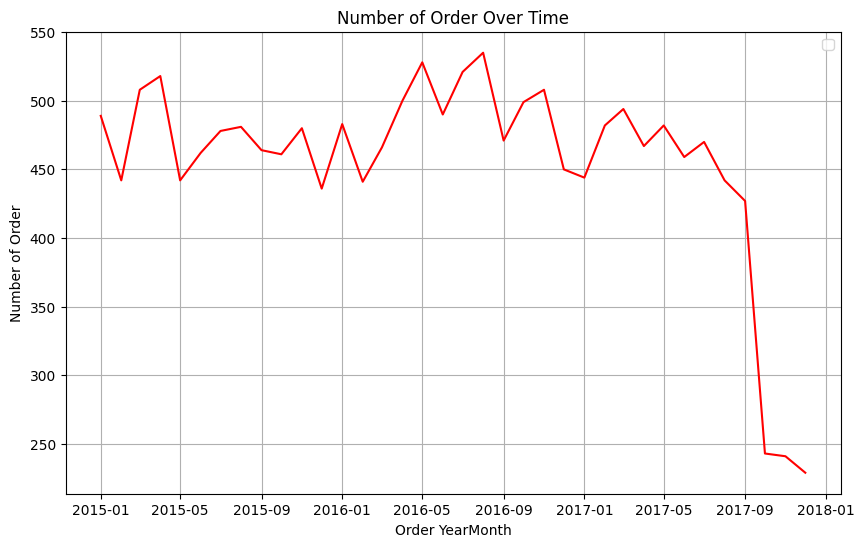

In [ ]:
order['Order YearMonth'] = pd.to_datetime(order['Order YearMonth'], format='%Y%m')

# Group data by year and month, and calculate the metrics
demand = order.groupby(['Order YearMonth'])['Order ID'].nunique().reset_index()
datetime# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth', y='Order ID', data=demand, color='red')
plt.ylabel('Number of Order')
plt.title('Number of Order Over Time')
plt.legend()
plt.grid(True)

The number of orders also witnessed a sharp decline of about 85% in Q4/2017

**Take away:** The number of order decrease significantly leading to the sharp decline in net sales and profit. In addition, both net sales and profits decline at the same time by the relative same amount, indicating that costs are unlikely to change and the company is actually facing serious problems from the revenue side

Now calculating how do the average order quantity and average unit price change over time?_

<AxesSubplot: xlabel='Order YearMonth', ylabel='Unit Price'>

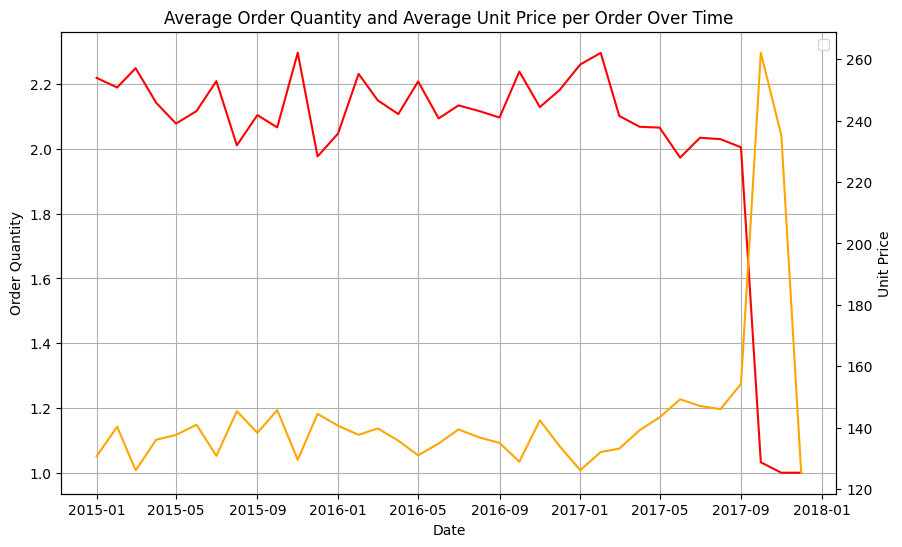

In [ ]:
order['Order YearMonth'] = pd.to_datetime(order['Order YearMonth'], format='%Y/%m')

# Group data by year and month, and calculate the metrics
demand = order.groupby(['Order YearMonth']).agg({'Order Quantity':'mean',
                                                'Unit Price':'mean'})

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth',y='Order Quantity', data = demand, color='red')
plt.xlabel('Date')
plt.title('Average Order Quantity and Average Unit Price per Order Over Time')
plt.legend()
plt.grid(True)

# Create a secondary y-axis
ax2 = plt.gca().twinx()
ax2.set_ylabel('Unit Price')
sns.lineplot(x='Order YearMonth',y='Unit Price', data = demand, color='orange')

It is more interesting when we look at average order quantity and average unit price per order over time, the two main factors that contribute to the average value of an order. While the average order quantity decreased, the average unit price rebounded strongly in 10/2017 (nearly doubled) but then also dropped sharply.

_Which product departments account for the majority of net sales and number of orders?_

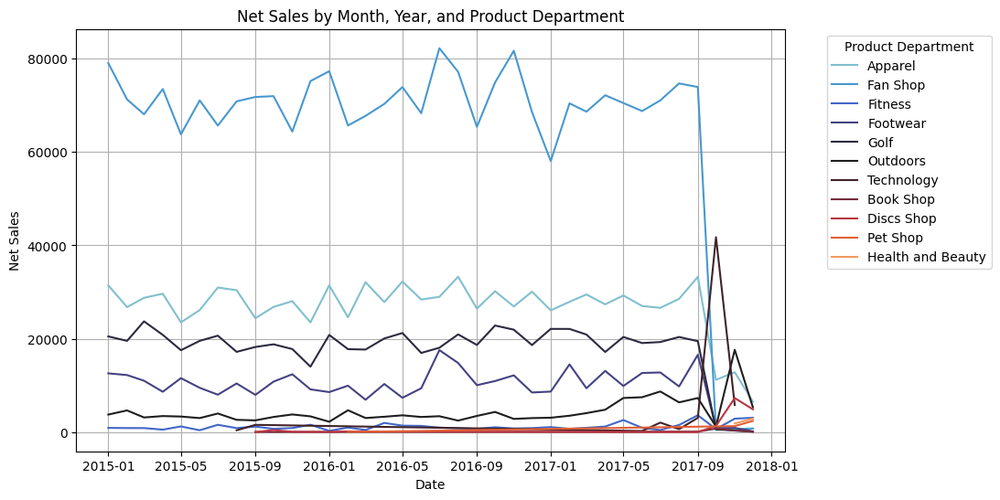

In [ ]:
# Group data by year and month, and calculate the metrics
product_sales = order.groupby(['Order YearMonth','Product Department'])['Net Sales'].sum().reset_index()

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth',y = 'Net Sales', data = product_sales, hue='Product Department', palette='icefire')

plt.xlabel('Date')
plt.title('Net Sales by Month, Year, and Product Department')
plt.legend(title = 'Product Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()

Apparel, Fanshop, Footwear and Golf are the product departments that contributed the most to the net sales. However, in Q4/2017, revenue from these product departments has suddenly plummeted and almost disappeared. Meanwhile, the product departments such as Technology and Discs Shop showed potential growth with increasing net sales

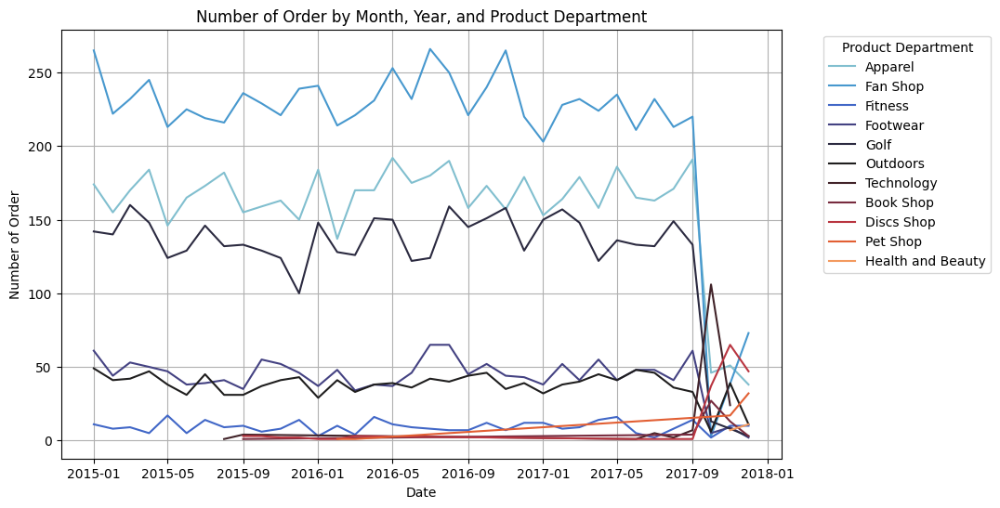

In [ ]:
# Group data by year and month, and calculate the metrics
product_sales = order.groupby(['Order YearMonth','Product Department'])['Order ID'].nunique().reset_index()
product_sales['Number of Order'] = product_sales['Order ID']
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth',y = 'Number of Order', data = product_sales, hue='Product Department', palette='icefire')
plt.xlabel('Date')
plt.title('Number of Order by Month, Year, and Product Department')
plt.legend(title = 'Product Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()

The same trend also occurs when we count the number of orders for each product department over time

**Take away:** Looking deeper into the product department, we can better gain insights into the decline of the business activities. The absence of the old leading - best selling items (Apparel, Fanshop, Footwear, Golf), which had been instrumental to the company’s success, was closely linked to this downturn.

### **Customer**

_How was the distribution of customers by country and market?_

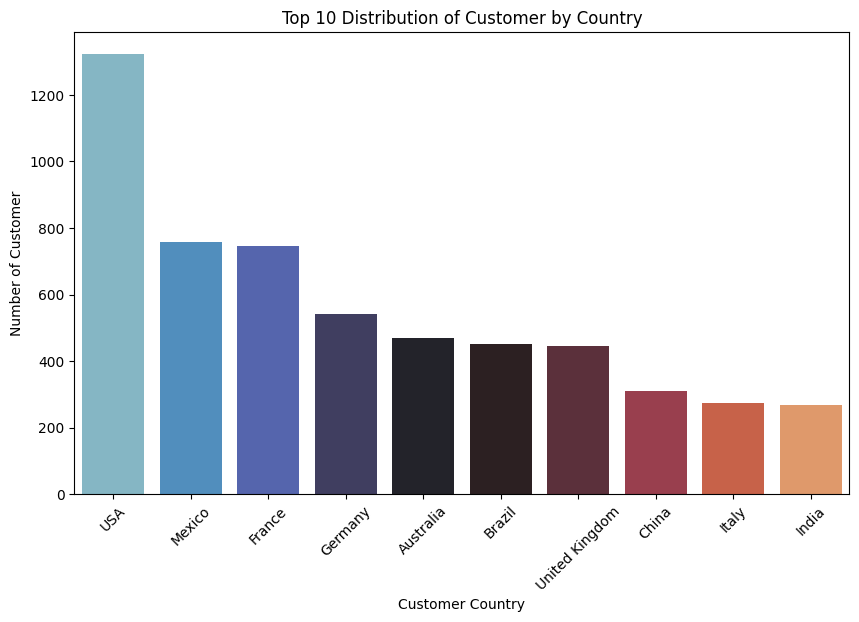

In [ ]:
# Group data by year and month, and calculate the metrics
customer = order.groupby(['Customer Country'])['Customer ID'].nunique().reset_index()
customer['Number of Customer'] = customer['Customer ID']  # Corrected line
customer = customer.sort_values(by='Number of Customer',ascending=False).reset_index(drop=True)
top_10 = customer[['Customer Country','Number of Customer']].head(10)

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data = top_10, x= 'Customer Country', y='Number of Customer', palette= 'icefire')
plt.title('Top 10 Distribution of Customer by Country')
plt.xticks(rotation = 45)
plt.show()

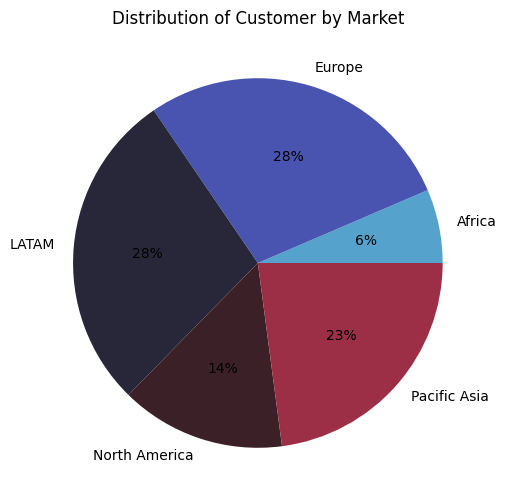

In [ ]:
# Group data by year and month, and calculate the metrics
customer = order.groupby(['Customer Market'])['Customer ID'].nunique().reset_index()
customer['Number of Customer'] = customer['Customer ID']

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
data = customer['Number of Customer']
labels = customer['Customer Market']

#define Seaborn color palette to use
colors = sns.color_palette('icefire')

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Distribution of Customer by Market')

plt.show()

The majority of customers come from LATAM, North America, Western Europe and Asia Pacific region. In which, customers from USA are much higher than other countries

*How many customers does the company have over time?*

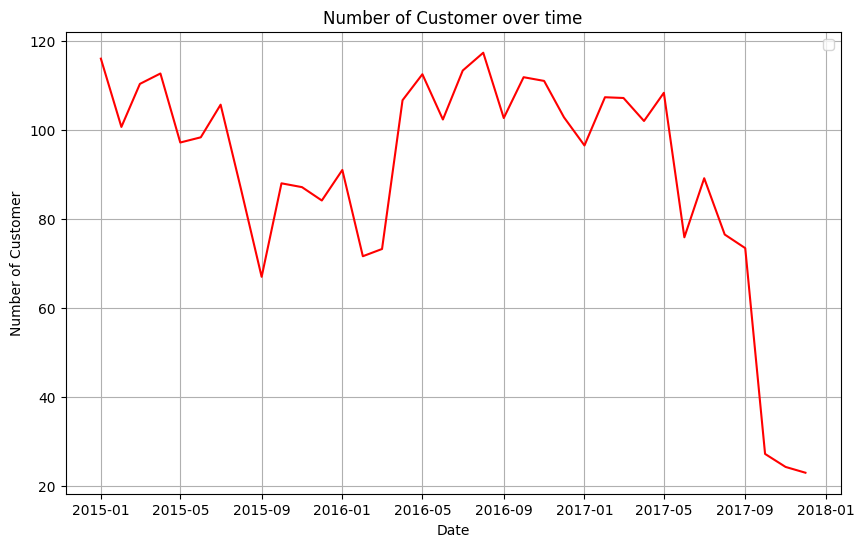

In [ ]:
# Group data by year and month, and calculate the metrics
customer = order.groupby(['Order YearMonth','Product Department'])['Customer ID'].nunique().reset_index()
customer['Number of Customer'] = customer['Customer ID']
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth',y = 'Number of Customer', data = customer, color ='red', ci=None)
plt.xlabel('Date')
plt.title('Number of Customer over time')
plt.legend()
plt.grid(True)

plt.show()

The number of customers per month ranges around 100 to 140. However, this number has decreased to below 100 between the end of 2015 and the beginning of 2016. Besides, a sharp decrease in the fourth quarter of 2017 confirmed for a drop in number of orders and a serious problem from the revenue side

_Are there any patterns or trends of buying behavior over time?_

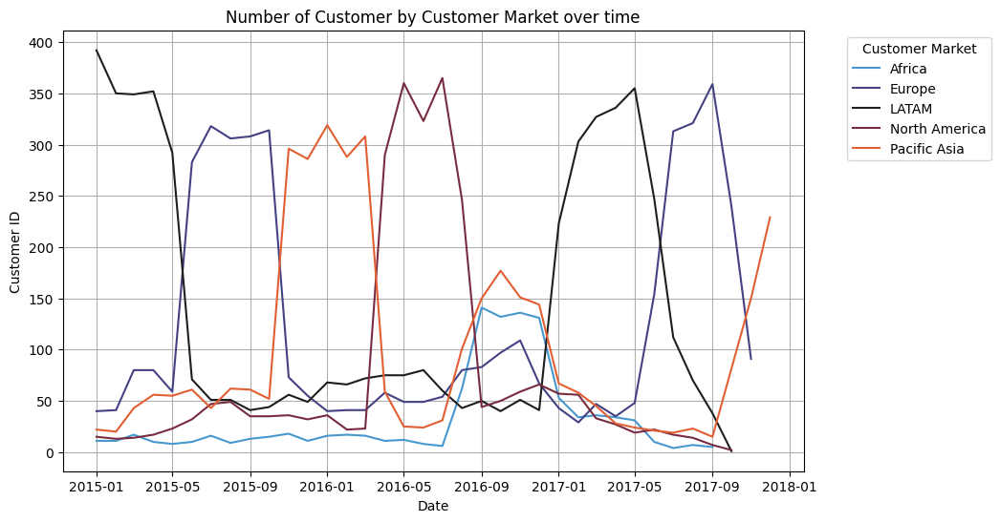

In [ ]:
# Group data by year and month, and calculate the metrics
customer = order.groupby(['Order YearMonth','Customer Market'])['Customer ID'].nunique().reset_index()

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth',y = 'Customer ID', data = customer, hue='Customer Market', palette='icefire')

plt.xlabel('Date')
plt.title('Number of Customer by Customer Market over time')
plt.legend(title = 'Customer Market', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()

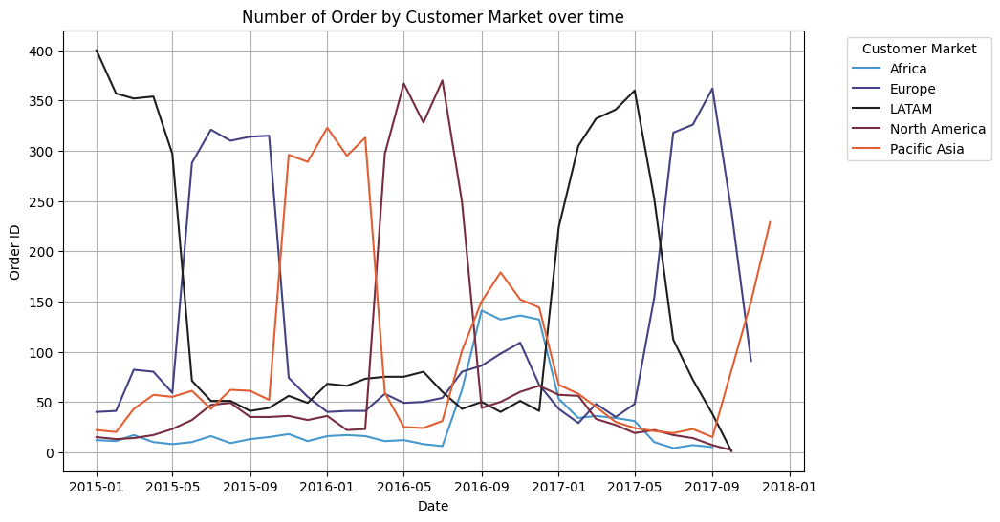

In [ ]:
# Group data by year and month, and calculate the metrics
customer = order.groupby(['Order YearMonth','Customer Market'])['Order ID'].nunique().reset_index()

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.lineplot(x='Order YearMonth',y = 'Order ID', data = customer, hue='Customer Market', palette='icefire')

plt.xlabel('Date')
plt.title('Number of Order by Customer Market over time')
plt.legend(title = 'Customer Market', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)

plt.show()

As you can see, there is a certain trend in the buying behavior of customers from different continents. Over time, the tendency to buy more often occurs in the LATAM, then in turn to Europe, Pacific Asia, North America and Africa. This trend continues to repeat from the LATAM

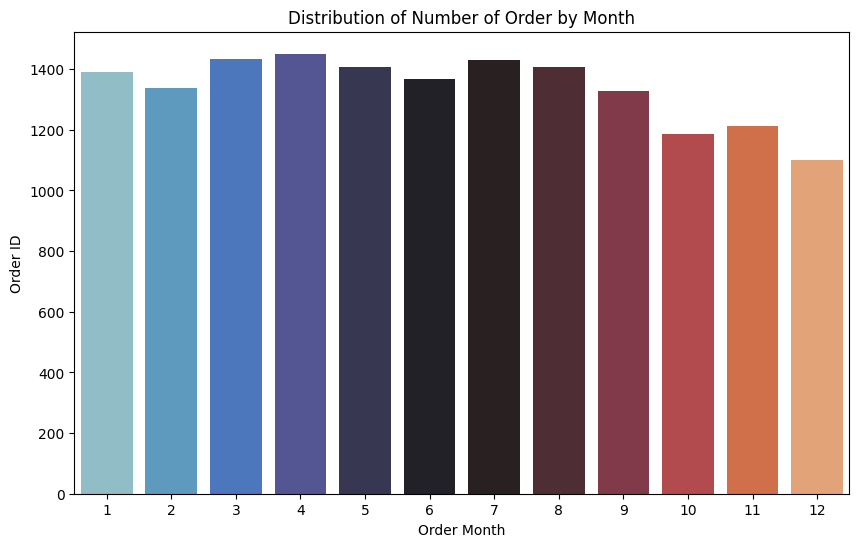

In [ ]:
# Group data by year and month, and calculate the metrics
order['Order Month'] = order['Order Month'].astype(int)
customer = order.groupby(['Order Month'])['Order ID'].nunique().reset_index()
customer = customer.sort_values(by='Order Month', ascending = False)
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data = customer, x= 'Order Month', y='Order ID', palette= 'icefire')
plt.title('Distribution of Number of Order by Month')
plt.show()


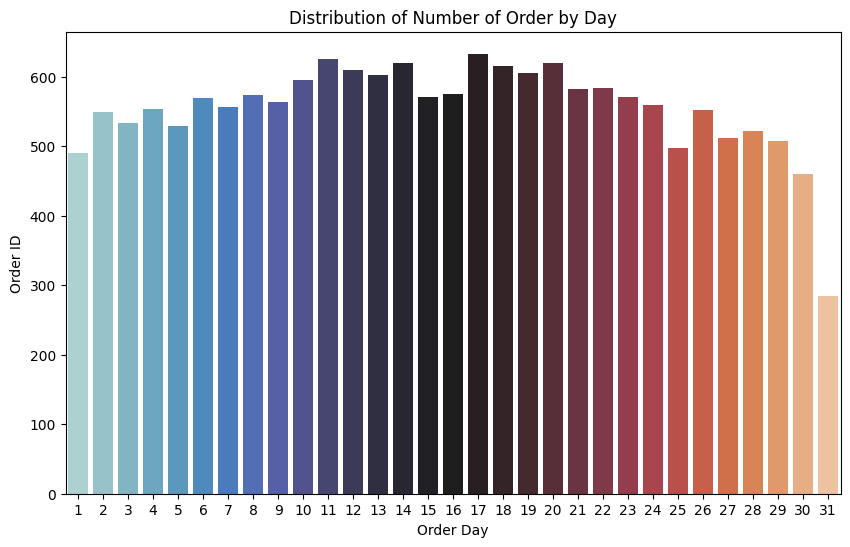

In [ ]:
# Group data by year and month, and calculate the metrics
order['Order Day'] = order['Order Day'].astype(int)
customer = order.groupby(['Order Day'])['Order ID'].nunique().reset_index()
customer = customer.sort_values(by='Order Day', ascending = False)
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data = customer, x= 'Order Day', y='Order ID', palette= 'icefire')
plt.title('Distribution of Number of Order by Day')
plt.show()


The number of orders by month does not has any significant difference.
In terms of days, customers usually order more in the middle of the month


**Take away:** Although over time, the buying haviour from key customer market has changed significantly, but the demand for ordering does not seem to have a strong fluctuation

### **Product**

_Which product categories and product names are most preferred?_

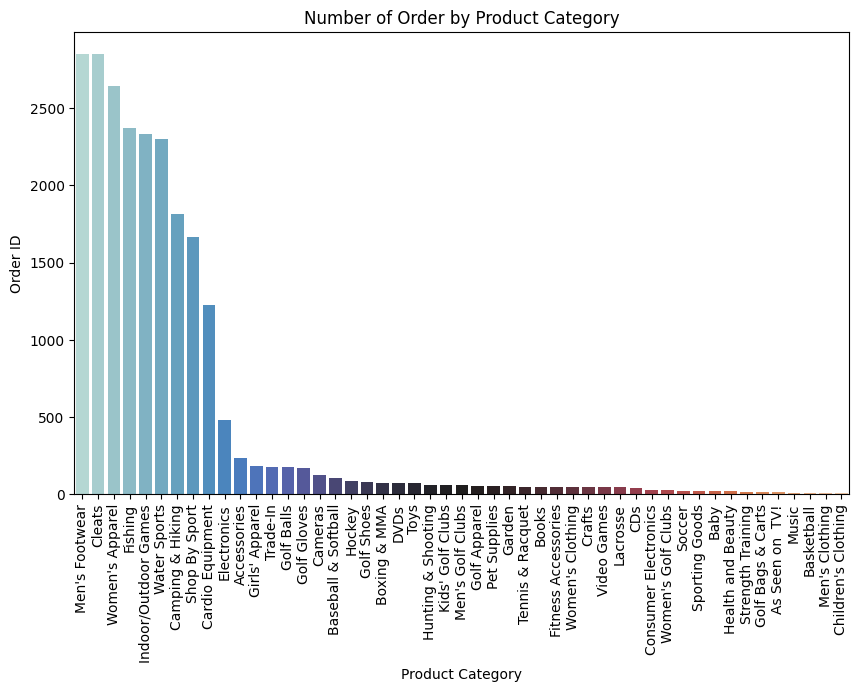

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
prefer = order.groupby(['Product Category'])['Order ID'].nunique().reset_index()
prefer = prefer.sort_values(by='Order ID',ascending=False)
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data=prefer, x='Product Category', y='Order ID', palette='icefire')
plt.title('Number of Order by Product Category')
plt.xticks(rotation = 90)
plt.show()

Cleats, Fishing, Camping & Hiking, Water Sports, Indoor/Outdoor Games, Women’s Apparel, Men’s Footwear, Shop by Sports and Cardio Equipment are the top 9 product categories with outstanding number of orders, completely overwhelm other categories. For less popular categories, Electronics outperforms the others

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
prefer = order.groupby(['Product Name'])['Order ID'].nunique().reset_index()
prefer = prefer.sort_values(by='Order ID',ascending=False)
#Top 10 Product name by the number of orders
prefer.head(10)

,Product Name,Order ID
53,Nike Men's CJ Elite 2 TD Football Cleat,2851
68,Perfect Fitness Perfect Rip Deck,2847
56,Nike Men's Dri-FIT Victory Golf Polo,2642
21,Field & Stream Sportsman 16 Gun Fire Safe,2372
64,O'Brien Men's Neoprene Life Vest,2336
67,Pelican Sunstream 100 Kayak,2297
18,Diamondback Women's Serene Classic Comfort Bi,1817
97,Under Armour Girls' Toddler Spine Surge Runni,1611
58,Nike Men's Free 5.0+ Running Shoe,1173
105,Web Camera,121


It can be seen that the gap between the top 9 product names in the lead and the product names behind is very large. Product name ranked 10th with only 179 orders while Product name ranked 9th had 1720 orders, nearly as 10 times.

_Which product categories and product names are most profitable?_

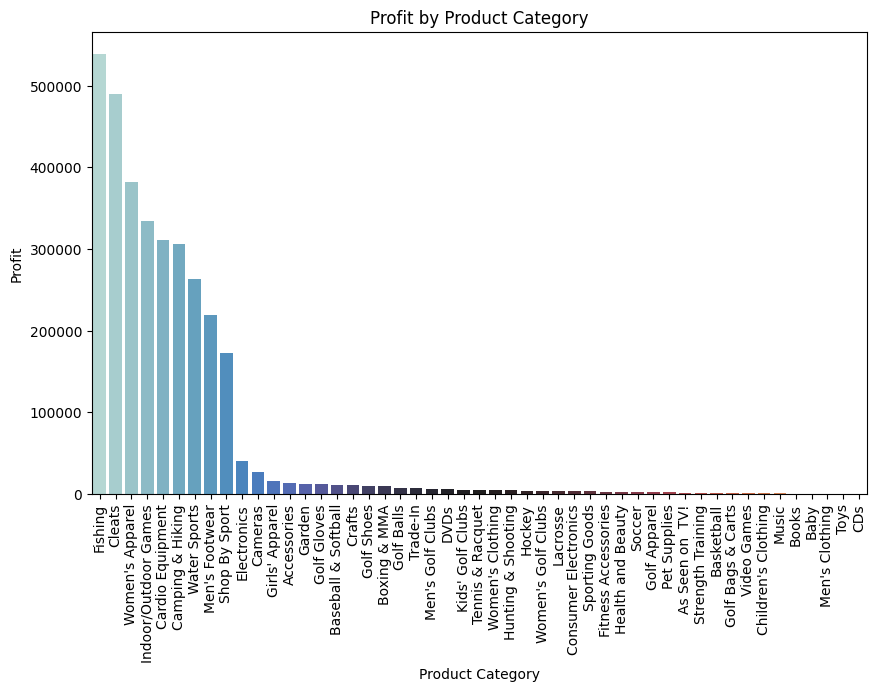

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
prefer = order.groupby(['Product Category'])['Profit'].sum().reset_index()
prefer = prefer.sort_values(by='Profit',ascending=False)
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data=prefer, x='Product Category', y='Profit', palette='icefire')
plt.title('Profit by Product Category')
plt.xticks(rotation = 90)
plt.show()

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
prefer = order.groupby(['Product Name'])['Profit'].sum().reset_index()
prefer = prefer.sort_values(by='Profit',ascending=False)

#Top 10 profitable product names
prefer.head(10)

,Product Name,Profit
21,Field & Stream Sportsman 16 Gun Fire Safe,538800.0
68,Perfect Fitness Perfect Rip Deck,489216.0
56,Nike Men's Dri-FIT Victory Golf Polo,382250.0
64,O'Brien Men's Neoprene Life Vest,333875.0
58,Nike Men's Free 5.0+ Running Shoe,307720.0
18,Diamondback Women's Serene Classic Comfort Bi,306600.0
67,Pelican Sunstream 100 Kayak,261700.0
53,Nike Men's CJ Elite 2 TD Football Cleat,218920.0
97,Under Armour Girls' Toddler Spine Surge Runni,168295.0
105,Web Camera,26499.0


It's no wonder that the best selling products are the most profitable

### **Inventory**

In [ ]:
inventory

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department,Storage Cost
0,Perfect Fitness Perfect Rip Deck,2017/12,0,0.69517,Cleats,Apparel,0.00000
1,Nike Men's Dri-FIT Victory Golf Polo,2017/12,2,1.29291,Women's Apparel,Golf,2.58582
2,O'Brien Men's Neoprene Life Vest,2017/12,0,0.56531,Indoor/Outdoor Games,Fan Shop,0.00000
3,Nike Men's Free 5.0+ Running Shoe,2017/12,1,1.26321,Cardio Equipment,Footwear,1.26321
4,Under Armour Girls' Toddler Spine Surge Runni,2017/12,0,1.47648,Shop By Sport,Golf,0.00000
...,...,...,...,...,...,...,...
4195,TaylorMade 2017 Purelite Stand Bag,2015/01,0,1.44662,Golf Gloves,Outdoors,0.00000
4196,Ogio Race Golf Shoes,2015/01,0,0.10310,Golf Bags & Carts,Outdoors,0.00000
4197,GolfBuddy VT3 GPS Watch,2015/01,0,1.77747,Kids' Golf Clubs,Outdoors,0.00000
4198,Titleist Small Wheeled Travel Cover,2015/01,0,0.15244,Golf Gloves,Outdoors,0.00000


In [ ]:
#overall descriptive analysis of the inventory management's key metrics
inventory[['Warehouse Inventory', 'Inventory Cost Per Unit', 'Storage Cost']].describe()

,Warehouse Inventory,Inventory Cost Per Unit,Storage Cost
count,4200.000000,4200.000000,4200.000000
mean,16.908095,1.236450,20.578791
std,71.121721,0.652183,100.453162
min,0.000000,0.102360,0.000000
25%,0.000000,0.672187,0.000000
50%,0.000000,1.262455,0.000000
75%,4.000000,1.800760,4.365012
max,931.000000,2.345030,1890.973240


Warehouse Inventory was spread widely with a high standard deviation of 71 while the average value is only about 16. Additionally, the 25th and 50th percentile values are both zero. The max value is 931 while the 75th percentile is just 4. There are definitely outliners

Text(0.5, 1.0, 'Warehouse Inventory')

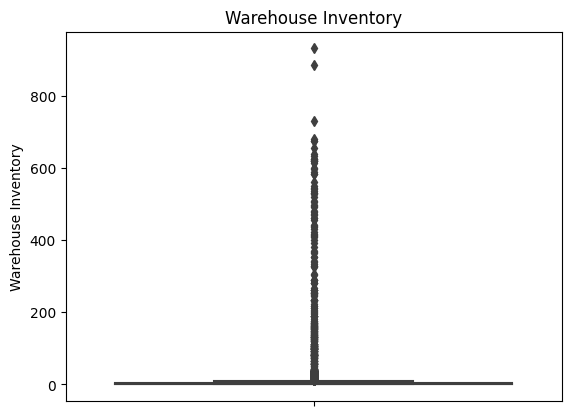

In [ ]:
#Drawing a boxplot of Warehouse Inventory
sns.boxplot(y='Warehouse Inventory', data=inventory)
plt.title('Warehouse Inventory')

In [ ]:
inventory[inventory['Warehouse Inventory']>10]

,Product Name,Year Month,Warehouse Inventory,Inventory Cost Per Unit,Product Category,Product Department,Storage Cost
56,Dell Laptop,2017/12,14,1.56369,None,None,21.89166
59,DVDs,2017/12,64,2.03553,DVDs,Discs Shop,130.27392
62,Summer dresses,2017/12,13,1.36250,Women's Clothing,Apparel,17.71250
65,Rock music,2017/12,16,2.26272,Music,Discs Shop,36.20352
68,Toys,2017/12,133,0.19512,Toys,Fan Shop,25.95096
...,...,...,...,...,...,...,...
4148,Glove It Women's Mod Oval 3-Zip Carry All Gol,2015/01,14,0.34936,Trade-In,Outdoors,4.89104
4150,Under Armour Women's Ignite Slide,2015/01,18,2.23827,Electronics,Footwear,40.28886
4155,Nike Women's Tempo Shorts,2015/01,43,2.30847,Cardio Equipment,Footwear,99.26421
4159,Hirzl Women's Hybrid Golf Glove,2015/01,13,1.34994,Golf Balls,Outdoors,17.54922


There are many product names with no inventory, while some product names have a very large inventory. Thus, the company only focuses on importing and selling the best selling product names. I have decided not to drop the outliners

_Which product departments account for the majority of warehouse inventory and
storage cost?_

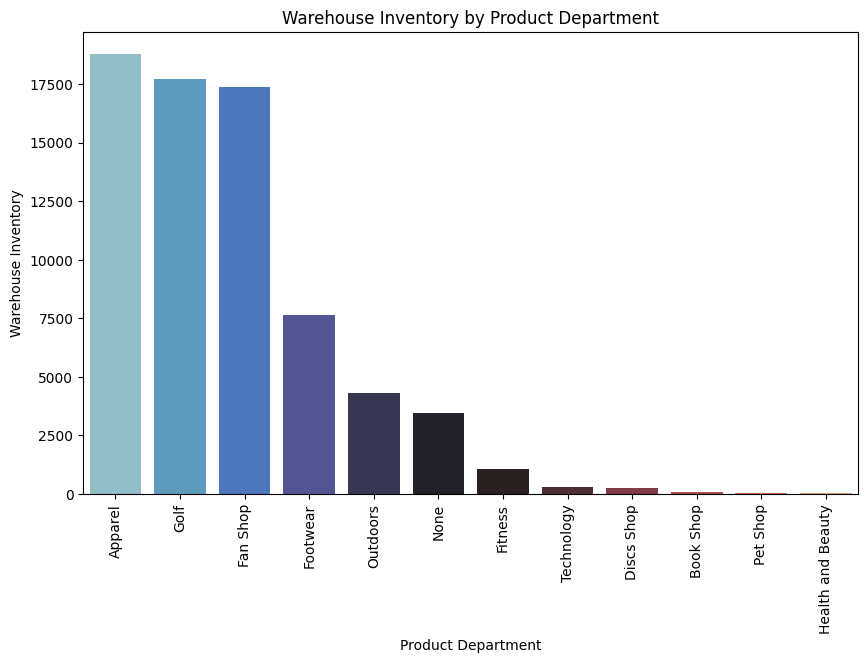

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
ware = inventory.groupby(['Product Department'])['Warehouse Inventory'].sum().reset_index()
ware = ware.sort_values(by='Warehouse Inventory',ascending=False)
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data=ware, x='Product Department', y='Warehouse Inventory', palette='icefire')
plt.title('Warehouse Inventory by Product Department')
plt.xticks(rotation = 90)
plt.show()

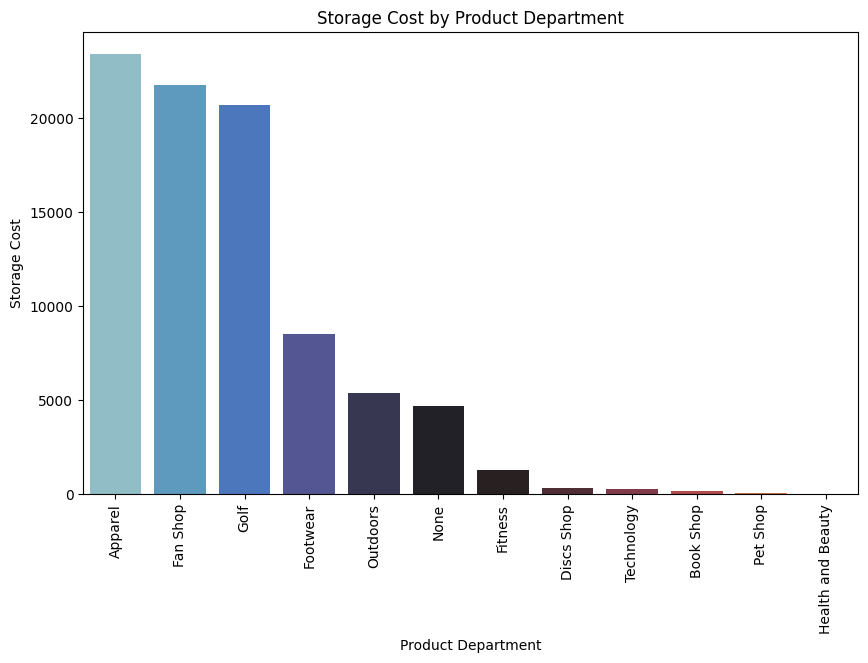

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
ware = inventory.groupby(['Product Department'])['Storage Cost'].sum().reset_index()
ware = ware.sort_values(by='Storage Cost',ascending=False)
# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
sns.barplot(data=ware, x='Product Department', y='Storage Cost', palette='icefire')
plt.title('Storage Cost by Product Department')
plt.xticks(rotation = 90)
plt.show()

The best selling product departments (Apparel, Fan Shop, Golf, Footwear) account for the most warehouse inventory and also account for the majority of storage costs.

_How do the warehouse inventory and storage costs change over time?_

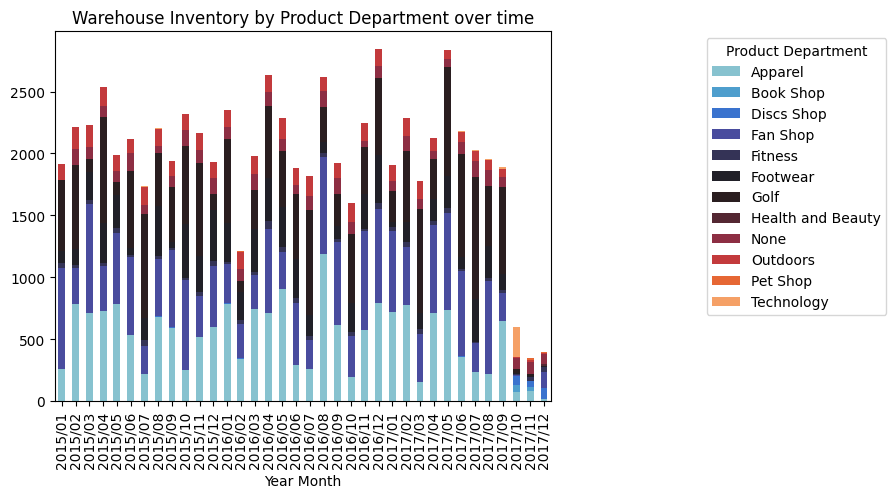

In [ ]:
# Group data by Order YearMonth and Product Department, and calculate the metrics
ware = inventory.groupby(['Year Month','Product Department']).agg({'Warehouse Inventory':'sum',
                                                                   'Storage Cost':'sum'})
ware = ware.sort_values(by='Year Month', ascending=True)

# Pivot the DataFrame
invent = ware.pivot_table(index='Year Month', columns='Product Department', values='Warehouse Inventory', aggfunc='first')

#Plotting
invent.plot(kind='bar', stacked=True, title='Warehouse Inventory by Product Department over time', color = sns.color_palette('icefire', n_colors =12))
plt.legend(title = 'Product Department', bbox_to_anchor=(1.3, 1), loc='upper left')
plt.show()

The best-selling departments  (Appareal, Golf, Fanshop) always have the highest amount of inventory but were almost out of stock in Q4/2017


In [ ]:
fulfillment.describe()

,Warehouse Order Fulfillment (days)
count,118.000000
mean,5.333898
std,2.414282
min,1.000000
25%,3.300000
50%,5.300000
75%,6.975000
max,9.900000


_What is the average of the average fulfillment order?_

In [ ]:
avg = fulfillment['Warehouse Order Fulfillment (days)'].mean()
avg

5.333898305084746

_Which product names have the lowest and highest average order fulfillment ?_

In [ ]:
#Top 10 product names by average fulfillment order
fulfillment = fulfillment.sort_values(by='Warehouse Order Fulfillment (days)',ascending=False)
top10 = fulfillment.head(10)
top10

,Product Name,Warehouse Order Fulfillment (days)
38,Titleist Pro V1x Golf Balls,9.9
80,Nike Kids' Grade School KD VI Basketball Shoe,9.9
66,Elevation Training Mask 2.0,9.8
48,Bridgestone e6 Straight Distance NFL Tennesse,9.5
13,LIJA Women's Eyelet Sleeveless Golf Polo,9.5
3,Nike Men's Free 5.0+ Running Shoe,9.4
65,Rock music,9.3
95,adidas Brazuca 2017 Official Match Ball,9.3
19,Columbia Men's PFG Anchor Tough T-Shirt,9.1
30,Team Golf Pittsburgh Steelers Putter Grip,9.1


In [ ]:
#Top 10 product names has lowest avg order fulfillment
fulfillment = fulfillment.sort_values(by='Warehouse Order Fulfillment (days)',ascending=True)
top10 = fulfillment.head(10)
top10

,Product Name,Warehouse Order Fulfillment (days)
112,Diamondback Girls' Clarity 24 Hybrid Bike 201,1.0
39,adidas Men's Germany Black Crest Away Tee,1.0
107,Total Gym 1400,1.3
92,Mio ALPHA Heart Rate Monitor/Sport Watch,1.3
88,LIJA Women's Button Golf Dress,1.4
104,Polar Loop Activity Tracker,1.4
21,Team Golf Tennessee Volunteers Putter Grip,1.7
98,Nike Men's Kobe IX Elite Low Basketball Shoe,1.8
7,Pelican Sunstream 100 Kayak,1.8
114,SOLE E35 Elliptical,1.9


_What average order fulfillment of each product departments?_

In [ ]:
#Merge table product and fulfillment
product_ful = pd.merge(fulfillment, product, on='Product Name')
product_ful

,Product Name,Warehouse Order Fulfillment (days),Product Category,Product Department
0,Diamondback Girls' Clarity 24 Hybrid Bike 201,1.0,Basketball,Fitness
1,adidas Men's Germany Black Crest Away Tee,1.0,Girls' Apparel,Golf
2,Total Gym 1400,1.3,Cleats,Apparel
3,Mio ALPHA Heart Rate Monitor/Sport Watch,1.3,Kids' Golf Clubs,Outdoors
4,LIJA Women's Button Golf Dress,1.4,Golf Shoes,Outdoors
...,...,...,...,...
108,LIJA Women's Eyelet Sleeveless Golf Polo,9.5,Golf Shoes,Outdoors
109,Bridgestone e6 Straight Distance NFL Tennesse,9.5,Electronics,Outdoors
110,Elevation Training Mask 2.0,9.8,Soccer,Fitness
111,Nike Kids' Grade School KD VI Basketball Shoe,9.9,Lacrosse,Fitness


In [ ]:
#Top 10 product names by average fulfillment order
product_dep = product_ful.groupby(['Product Department'])['Warehouse Order Fulfillment (days)'].mean()
product_dep = product_dep.sort_values(ascending=False)
product_dep

Product Department
Discs Shop           7.050000
Pet Shop             6.900000
Apparel              5.962500
Fitness              5.950000
Golf                 5.562500
Outdoors             5.515385
Book Shop            5.200000
Footwear             4.876923
Technology           4.400000
Fan Shop             3.955556
Health and Beauty    2.300000
Name: Warehouse Order Fulfillment (days), dtype: float64

**Take away:** Interestingly, the best-selling parts have the longest replenishment times, in stark contrast to lesser-known products like Technology and Health and Beauty.

### **Shipment**

In [ ]:
order

,Order ID,Order YearMonth,Order Year,Order Month,Order Day,Order Quantity,Product Department,Product Category,Product Name,Customer ID,Customer Market,Customer Region,Customer Country,Warehouse Country,Shipment Year,Shipment Month,Shipment Day,Shipment Mode,Shipment Days - Scheduled,Gross Sales,Discount %,Profit,Order Date,Shipment Date,Shipment YearMonth,Shipping Time,Delay Shipment,Net Sales,Unit Price
0,3535,2015-02-01,2015,2,21,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,7840,LATAM,Central America,Mexico,Puerto Rico,2015,2,27,Standard Class,4,400.0,0.25,200.0,2015/02/21,2015-02-27,2015-02-01,6,Late,300.00,400.0
1,4133,2015-03-01,2015,3,2,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,1203,LATAM,South America,Brazil,Puerto Rico,2015,3,6,Standard Class,4,400.0,0.09,200.0,2015/03/02,2015-03-06,2015-03-01,4,On time,364.00,400.0
2,7396,2015-04-01,2015,4,18,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,10866,LATAM,Central America,Mexico,Puerto Rico,2015,4,20,Standard Class,4,400.0,0.06,200.0,2015/04/18,2015-04-20,2015-04-01,2,On time,376.00,400.0
3,11026,2015-06-01,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.15,200.0,2015/06/10,2015-06-12,2015-06-01,2,On time,340.00,400.0
4,11026,2015-06-01,2015,6,10,1,Fan Shop,Fishing,Field & Stream Sportsman 16 Gun Fire Safe,3576,Europe,Northern Europe,Denmark,Puerto Rico,2015,6,12,Standard Class,4,400.0,0.13,200.0,2015/06/10,2015-06-12,2015-06-01,2,On time,348.00,400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30866,73246,2017-12-01,2017,12,5,1,Fan Shop,Toys,Toys,16799,Pacific Asia,Oceania,Australia,Puerto Rico,2017,12,11,Standard Class,4,12.0,0.06,6.0,2017/12/05,2017-12-11,2017-12-01,6,Late,11.28,12.0
30867,7908,2015-04-01,2015,4,26,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,11950,LATAM,South America,Paraguay,Puerto Rico,2015,4,30,Standard Class,4,30.0,0.12,68.0,2015/04/26,2015-04-30,2015-04-01,4,On time,26.40,30.0
30868,29326,2016-03-01,2016,3,4,1,Fan Shop,Hunting & Shooting,ENO Atlas Hammock Straps,8161,Pacific Asia,South Asia,India,Puerto Rico,2016,3,6,Second Class,2,30.0,0.09,68.0,2016/03/04,2016-03-06,2016-03-01,2,On time,27.30,30.0
30869,63308,2017-07-01,2017,7,13,1,Fan Shop,Hunting & Shooting,insta-bed Neverflat Air Mattress,5733,Europe,Western Europe,Germany,Puerto Rico,2017,7,17,Second Class,2,150.0,0.02,60.0,2017/07/13,2017-07-17,2017-07-01,4,Late,147.00,150.0


_Which warehouses are orders shipped from?_

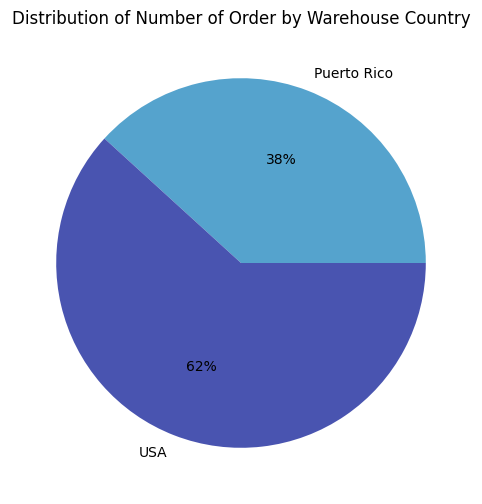

In [ ]:
# Group data by year and month, and calculate the metrics
house = order.groupby(['Warehouse Country'])['Order ID'].nunique().reset_index()

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
data = house['Order ID']
labels = house['Warehouse Country']

#define Seaborn color palette to use
colors = sns.color_palette('icefire')

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Distribution of Number of Order by Warehouse Country')

plt.show()

Warehouse are located in only two places, USA and Peuter Rico which located in North and Central America. Also, orders are shipped mainly from the USA with more than 60%

_Which shipment modes are preferred by customers?_

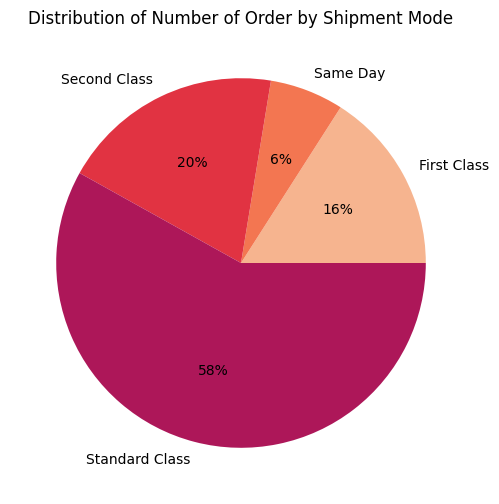

In [ ]:
# Group data by year and month, and calculate the metrics
mode = order.groupby(['Shipment Mode'])['Order ID'].nunique().reset_index()

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

# Plotting
data = mode['Order ID']
labels = mode['Shipment Mode']

#define Seaborn color palette to use
colors = sns.color_palette('rocket_r')

#create pie chart
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Distribution of Number of Order by Shipment Mode')

plt.show()

It is not surprising that customers prefer to choose Standard Class, which account for 58% of the total orders.

_What is the shipping time for each shipment mode?_

In [ ]:
# Group data and calculate the metrics
time = order.groupby(['Shipping Time','Shipment Mode']).agg({'Order ID':'nunique'})
time = time.sort_values(by='Shipping Time', ascending=True)

# Pivot the DataFrame
time = time.pivot_table(index='Shipping Time', columns='Shipment Mode', values='Order ID', aggfunc='first')
time

Shipment Mode,First Class,Same Day,Second Class,Standard Class
Shipping Time,,,,
0,48.0,310.0,72.0,161.0
1,55.0,269.0,61.0,139.0
2,1484.0,139.0,940.0,2890.0
3,163.0,73.0,241.0,851.0
4,144.0,80.0,825.0,2507.0
5,175.0,92.0,221.0,824.0
6,160.0,76.0,535.0,1665.0
7,4.0,3.0,10.0,13.0
8,4.0,3.0,6.0,15.0


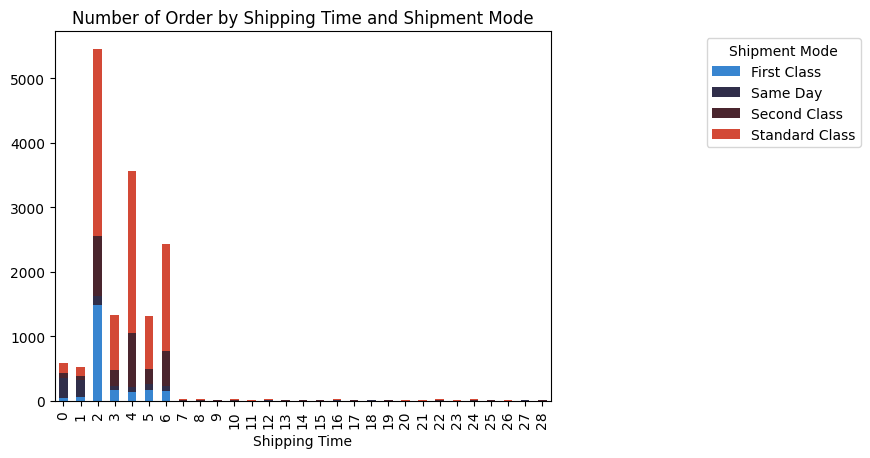

In [ ]:
#Plotting
time.plot(kind='bar', stacked=True, title='Number of Order by Shipping Time and Shipment Mode', color = sns.color_palette('icefire', n_colors =4))
plt.legend(title = 'Shipment Mode', bbox_to_anchor=(1.3, 1), loc='upper left')
plt.show()

**Take away:** The company is having problems with the shipping time because there are quite a few orders that are selected for fast shipment mode such as same day and first class, but the items are shipped days later

_What is the late shipment rate by product department and market?_

In [ ]:
# Calculate the number of late orders and total orders per Product Department
late = order[order['Delay Shipment'] == 'Late'].groupby('Product Department').size().reset_index(name='Late Orders')
total = order.groupby('Product Department').size().reset_index(name='Total Orders')
late_order = pd.merge(late, total, on='Product Department')

#Calculate late shipment rate by product department
late_order['Late Shipment Rate'] = late_order['Late Orders']/late_order['Total Orders']
late_order


,Product Department,Late Orders,Total Orders,Late Shipment Rate
0,Apparel,3017,6828,0.441857
1,Book Shop,20,48,0.416667
2,Discs Shop,67,167,0.401198
3,Fan Shop,4302,10168,0.423092
4,Fitness,132,338,0.390533
5,Footwear,712,1653,0.430732
6,Golf,2205,5041,0.437413
7,Health and Beauty,6,18,0.333333
8,Outdoors,605,1399,0.432452
9,Pet Shop,24,51,0.470588


Most product departments have LSR around 40%, except for Health and Beauty which goes up to more than 50%

In [ ]:
# Calculate the number of late orders and total orders per Product Department
late = order[order['Delay Shipment'] == 'Late'].groupby('Customer Market').size().reset_index(name='Late Orders')
total = order.groupby('Customer Market').size().reset_index(name='Total Orders')
late_order = pd.merge(late, total, on='Customer Market')

#Calculate late shipment rate by product department
late_order['Late Shipment Rate'] = late_order['Late Orders']/late_order['Total Orders']
late_order


,Customer Market,Late Orders,Total Orders,Late Shipment Rate
0,Africa,640,1661,0.385310
1,Europe,3145,7171,0.438572
2,LATAM,3357,7788,0.431048
3,North America,1708,3873,0.441002
4,Pacific Asia,2317,5368,0.431632


It's interesting that LSRs are nearly equal in all markets, although long distances can naturally cause LSRs to increase.

_How the late shipment rate fluctuate over time?_

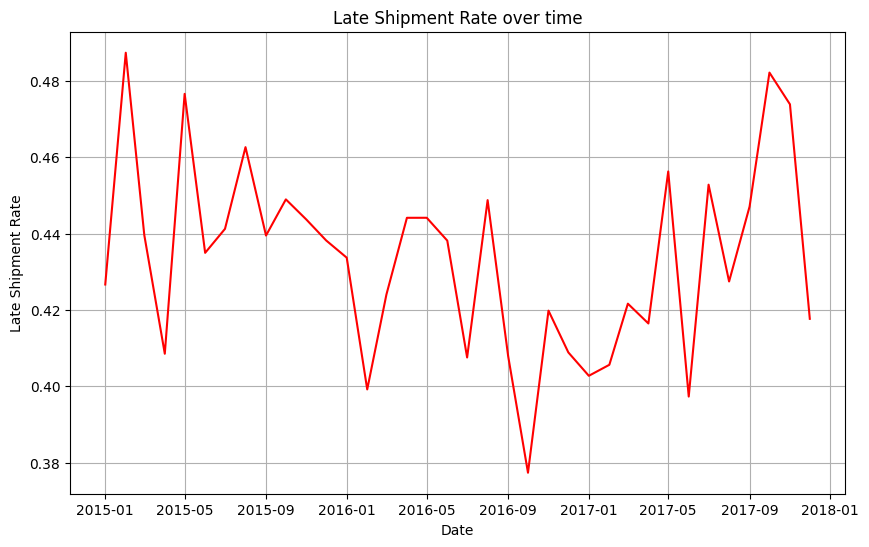

In [ ]:
# Calculate the number of late orders and total orders per Product Department
late = order[order['Delay Shipment'] == 'Late'].groupby('Shipment YearMonth').size().reset_index(name='Late Orders')
total = order.groupby('Shipment YearMonth').size().reset_index(name='Total Orders')
late_order = pd.merge(late, total, on='Shipment YearMonth')

#Calculate late shipment rate by product department
late_order['Late Shipment Rate'] = late_order['Late Orders']/late_order['Total Orders']

# Set up the figure and axes
fig, ax1 = plt.subplots(figsize=(10, 6))

#Plotting
sns.lineplot(x='Shipment YearMonth',y = 'Late Shipment Rate', data = late_order, color ='red')

plt.xlabel('Date')
plt.title('Late Shipment Rate over time')
plt.grid(True)

plt.show()

The late shipment rate has ranged from 30% to 50% over time

**Take away:** The high late shipment rate of average 40% over a long time regardless the product departments or geography, which remains concerning and indicates inefficiencies in the supply chain system that need improvement


We would expect that a product name with a high average order fulfillment will have a high LSR. But the graph shows no correlation between the two variables

**Take away:** The late shipments are not directly linked to the order fulfillment time but rather point to issues within the company's delivery system (shipping from warehouse to the customer). In the EDA, the late shipment rate in different markets is similar, showing that this situation seems to happen in general, regardless of geography. The company will need to improve its delivery system

## **SUGGESTIONS**

So far, we have accomplished the targets required by the business regarding supply chain inefficiencies and potential problems:

**1. Sharp decline in revenue and profit:** The most likely root cause of business downturn comes from a supply chain disruption on the supplier network such as delays in sourcing, transportation, distribution or problem with suppliers could have affected the company's ability to replenish the warehouse inventory promptly, especially for the products of XA and YA segments.

**2. Overstock and Understock:** The company often encounters overstock situation, causing excess inventory and wasting storage costs. Sometimes the company is also understocked. This shows that inventory management is not really implemented effectively yet

**3. High late shipment rate:** The company has a rather concerning late shipment rate (30 - 50%) which related to the delivery system